## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
# %matplotlib qt


Bad key text.latex.unicode in file c:\users\luca\anaconda3\envs\conda-cv-nd\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 112 ('text.latex.unicode : False # use "ucs" and "inputenc" LaTeX packages for handling')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key savefig.frameon in file c:\users\luca\anaconda3\envs\conda-cv-nd\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 423 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key nbagg.transparent in file c:\users\luca\anaconda3\envs\conda-cv-nd\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 426 ('nbagg.transparent: True')
You probably need to get an updated ma

In [16]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

#cv2.destroyAllWindows()

## And so on and so forth...

In [21]:
def calibrate_camera(images, nx, ny, debug = 0):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            #img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    return mtx, dist

In [184]:
def undistort(img, mtx, dist, debug = 0):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    if debug == 1:
        plt.figure(figsize=(24, 9))
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return dst

def undistort_and_unwarp(img, nx, ny, mtx, dist, offset, src, debug = 0):
    img_size = (img.shape[1], img.shape[0])
    
    # Undistort using mtx and dist
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert to grayscale
    if len(undistorted.shape) == 3:
        undistorted_gray = cv2.cvtColor(undistorted,cv2.COLOR_RGB2GRAY)
        
    # define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    dst = np.float32([
        [offset, 0],                       # top-left corner
        [img_size[0]-offset, 0],           # top-right corner
        [offset, img_size[1]],             # bottom-left corner
        [img_size[0]-offset, img_size[1]]  # bottom-right corner
    ])

    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(undistorted, M, img_size, flags=cv2.INTER_LINEAR)

    if debug == 1:
        plt.figure(figsize=(24, 9))
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img, cmap='gray')
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(warped, cmap='gray')
        ax2.set_title('Undistorted And Wreapped Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    return warped, M

<Figure size 1728x648 with 0 Axes>

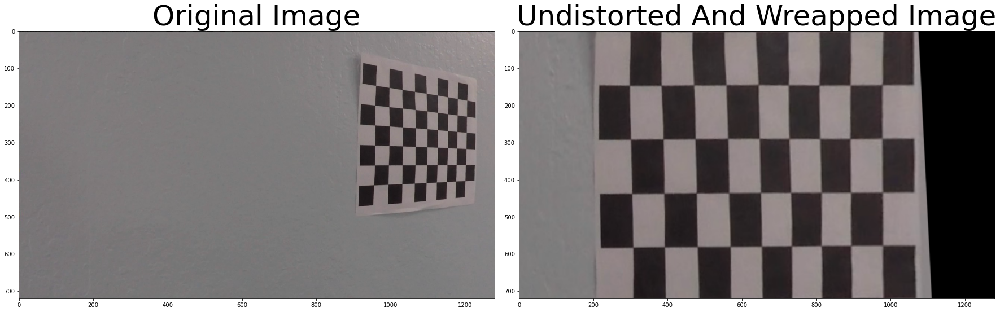

In [81]:
nx = 9
ny = 6

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

mtx, dist = calibrate_camera(images, nx, ny, 0)

# Step through the list and search for chessboard corners
for fname in images[5:6]:
    img = cv2.imread(fname)  
    
    # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
    #src = np.float32([corners[0], corners[8], corners[45], corners[53]])
    # to be updeted with the road region of interest
    src = np.float32([[969.1136, 140.23738], [1247.3464, 172.00374], [956.5, 413], [1235.2638, 404.97147]])
    
    warped, M = undistort_and_unwarp(img, nx, ny, mtx, dist, src, 1)

<Figure size 1728x648 with 0 Axes>

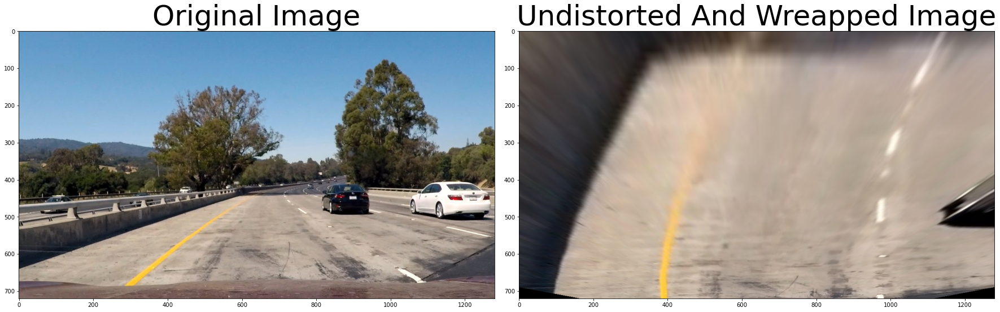

<Figure size 1728x648 with 0 Axes>

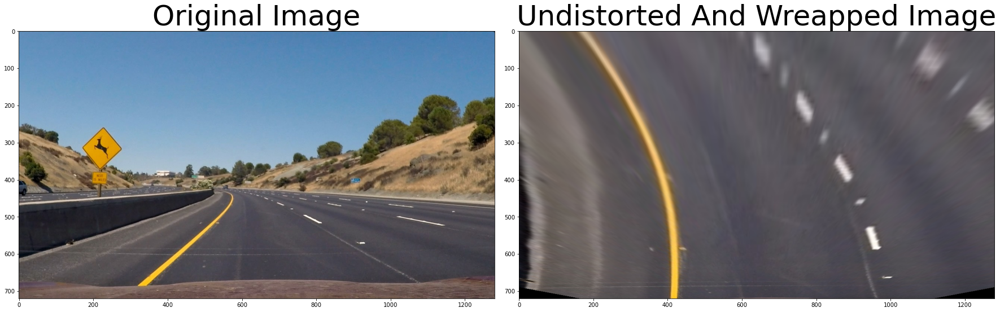

<Figure size 1728x648 with 0 Axes>

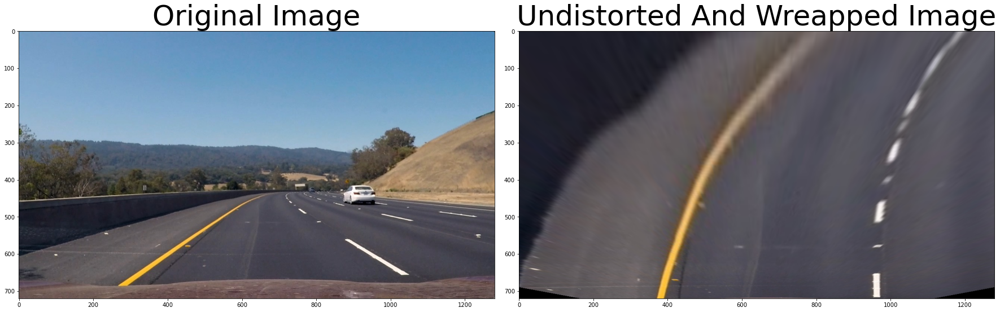

<Figure size 1728x648 with 0 Axes>

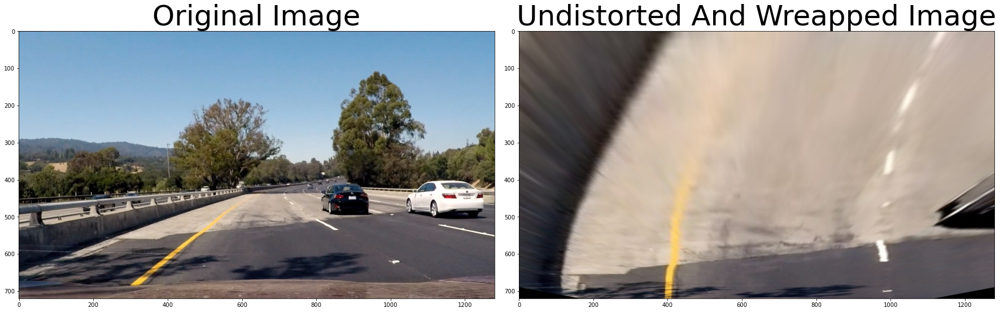

<Figure size 1728x648 with 0 Axes>

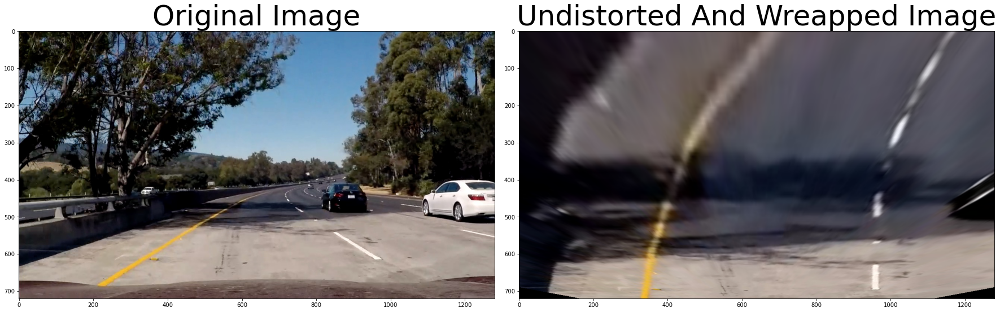

<Figure size 1728x648 with 0 Axes>

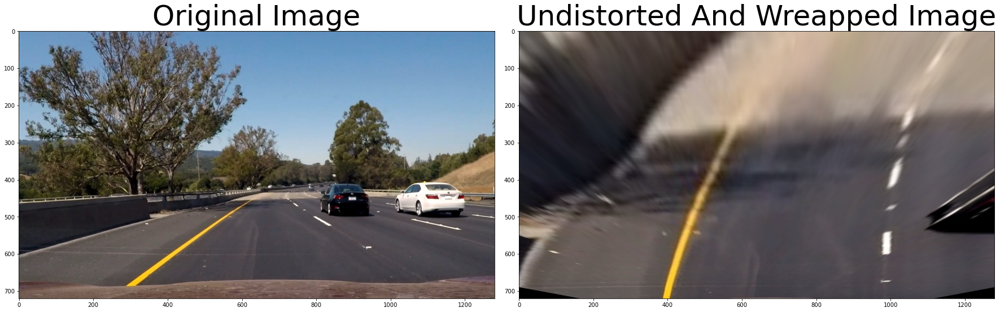

<Figure size 1728x648 with 0 Axes>

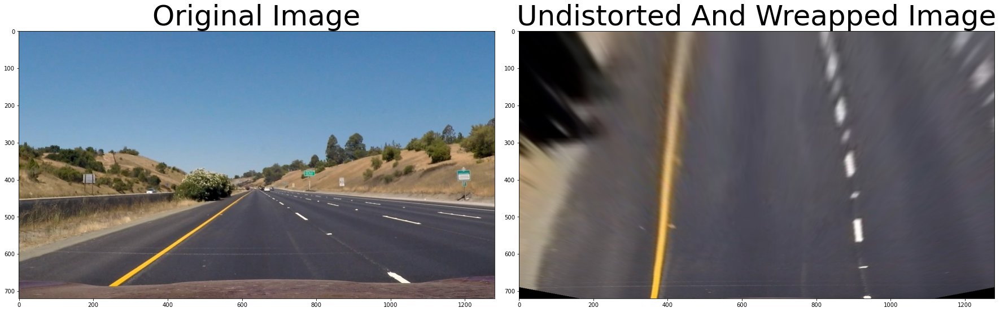

<Figure size 1728x648 with 0 Axes>

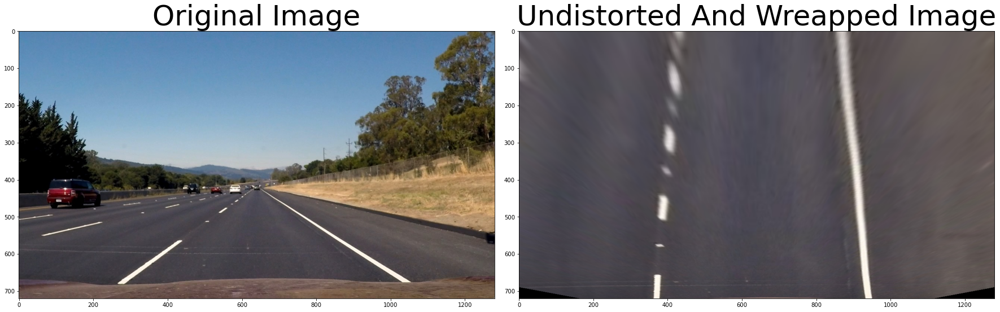

In [185]:
nx = 9
ny = 6
offset = 300

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

mtx, dist = calibrate_camera(images, nx, ny, 0)

images = glob.glob('test_images/test*.jpg')
images = images + glob.glob('test_images/straight_lines*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)  
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    # define 4 source points src = np.float32([[,],[,],[,],[,]])
    #src = np.float32([corners[0], corners[8], corners[45], corners[53]])
    # to be updeted with the road region of interest
    src = np.float32([[590, 440], [690, 440], [180, 680], [1100, 680]])
    
    warped, M = undistort_and_unwarp(img, nx, ny, mtx, dist, offset, src, 1)

In [175]:
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, g_thresh=(30, 255), s_thresh=(170, 255), l_thresh=(20, 100), debug = 0):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    gray_binary_output = np.zeros_like(scaled_sobel)
    gray_binary_output[(scaled_sobel >= g_thresh[0]) & (scaled_sobel <= g_thresh[1])] = 1
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    l_binary_output = np.zeros_like(scaled_sobel)
    l_binary_output[(scaled_sobel >= l_thresh[0]) & (scaled_sobel <= l_thresh[1])] = 1
    
    # Threshold color channel
    s_binary_output = np.zeros_like(s_channel)
    s_binary_output[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(l_binary_output), l_binary_output, s_binary_output)) * 255
    
    # Combine all pixels detected above
    color_binary = cv2.bitwise_or(l_binary_output, s_binary_output)
    #color_binary = cv2.bitwise_or(gray_binary_output, color_binary)
    
    if debug == 1:
        plt.figure(figsize=(24, 9))
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(color_binary, cmap='gray')
        ax2.set_title('HLS Binary Output', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    # Return a binary image of threshold result
    return color_binary

<Figure size 1728x648 with 0 Axes>

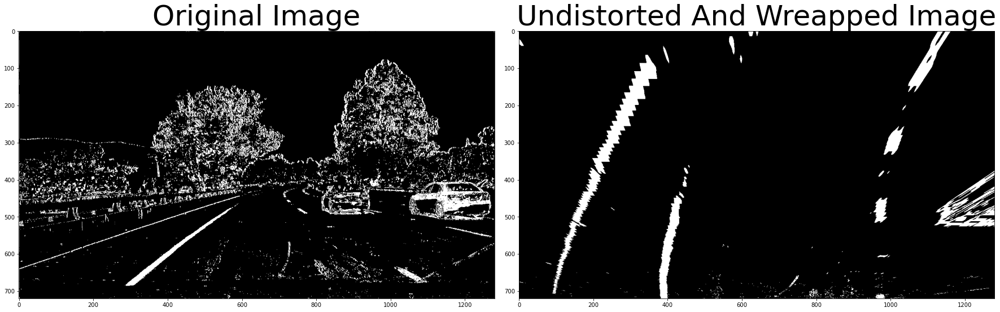

<Figure size 1728x648 with 0 Axes>

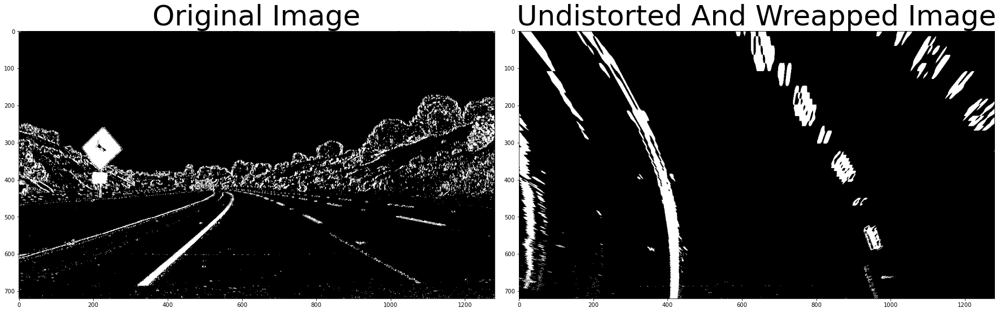

<Figure size 1728x648 with 0 Axes>

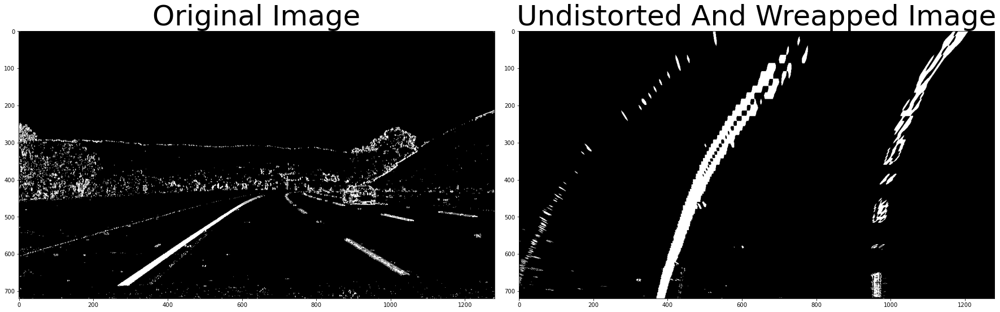

<Figure size 1728x648 with 0 Axes>

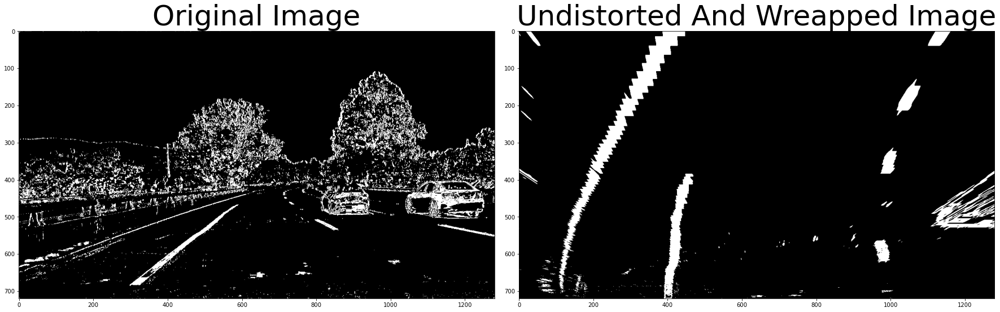

<Figure size 1728x648 with 0 Axes>

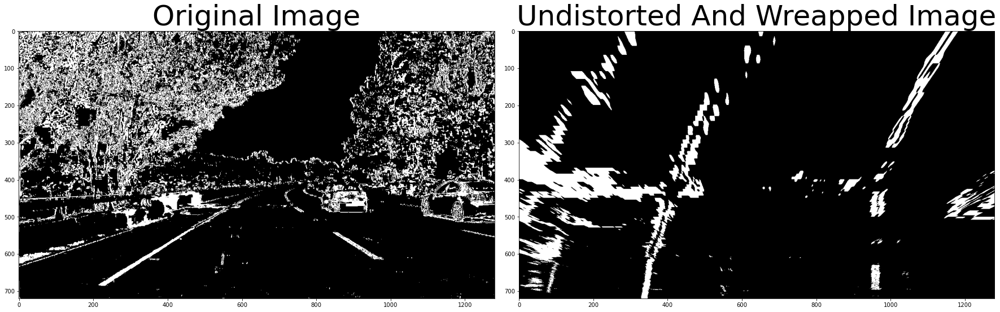

<Figure size 1728x648 with 0 Axes>

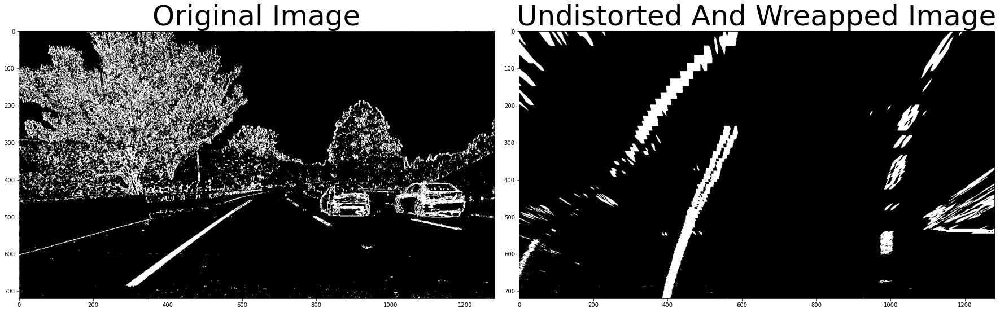

<Figure size 1728x648 with 0 Axes>

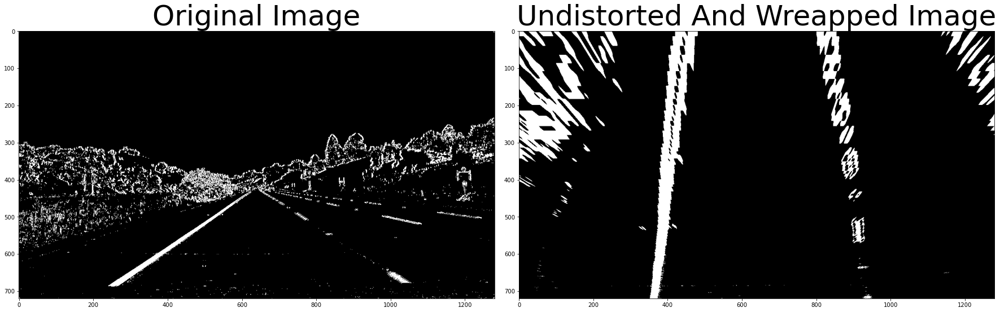

<Figure size 1728x648 with 0 Axes>

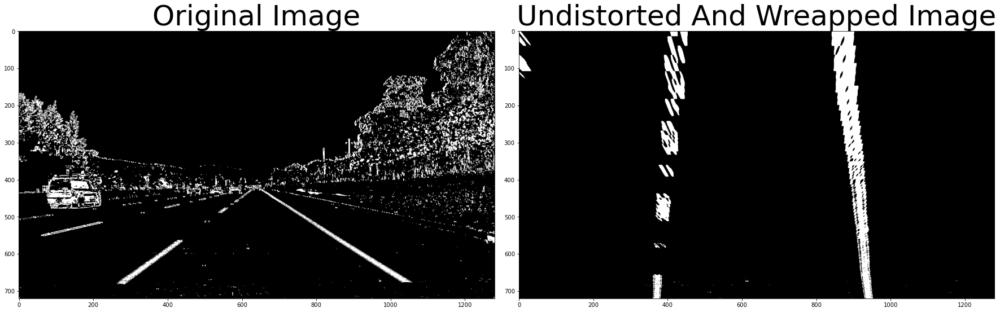

In [197]:
images = glob.glob('test_images/test*.jpg')
images = images + glob.glob('test_images/straight_lines*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)  
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    hls_binary = hls_select(img, g_thresh=(30, 255), s_thresh=(160, 255), l_thresh=(20, 100), debug=0)
    
    src = np.float32([[590, 440], [690, 440], [180, 680], [1100, 680]])
    warped, M = undistort_and_unwarp(hls_binary, nx, ny, mtx, dist, offset, src, 1)